<a href="https://colab.research.google.com/github/misterbwang/Comic-AudioBooks/blob/master/EfficeintNet_d7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install TensorFlow2 Object Detection Dependencies

In [ ]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

https://colab.research.google.com/github/ChintanThacker/Facial_Expression_EfficientNet/blob/master/EfficientNet_without_trainable_parameter.ipynb

In [ ]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697012 sha256=ff02d673367ac15da8a2ccbd03837bb1da5299a60e746f38aa84c035b567ef0d
  Stored in directory: /tmp/pip-ephem-wheel-cache-z4u6pq4o/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1


In [ ]:
#!python3 -m pip install numpy -I

In [ ]:
!pip install numpy==1.23.5

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip freeze | grep numpy

numpy==1.23.5


In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import os
import random
import io
import imageio
import glob
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage

import tensorflow as tf

import object_detection.utils
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

%matplotlib inline

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:
tf.__version__

'2.12.0'

In [ ]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py


2023-05-02 00:17:35.697269: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
Running tests under Python 3.10.11: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2023-05-02 00:17:46.215921: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
W0502 00:17:46.254253 1400

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def plot_detections(image_np,
                    boxes,
                    classes,
                    scores,
                    category_index,
                    figsize=(12, 16),
                    image_name=None):
  """Wrapper function to visualize detections.

  Args:
    image_np: uint8 numpy array with shape (img_height, img_width, 3)
    boxes: a numpy array of shape [N, 4]
    classes: a numpy array of shape [N]. Note that class indices are 1-based,
      and match the keys in the label map.
    scores: a numpy array of shape [N] or None.  If scores=None, then
      this function assumes that the boxes to be plotted are groundtruth
      boxes and plot all boxes as black with no classes or scores.
    category_index: a dict containing category dictionaries (each holding
      category index `id` and category name `name`) keyed by category indices.
    figsize: size for the figure.
    image_name: a name for the image file.
  """
  image_np_with_annotations = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_annotations,
      boxes,
      classes,
      scores,
      category_index,
      use_normalized_coordinates=True,
      min_score_thresh=0.8)
  if image_name:
    plt.imsave(image_name, image_np_with_annotations)
  else:
    plt.imshow(image_np_with_annotations)

# Prepare Tensorflow 2 Object Detection Training Data


Roboflow automatically creates our TFRecord and label_map files that we need!

**Generating your own TFRecords the only step you need to change for your own custom dataset.**

Because we need one TFRecord file for our training data, and one TFRecord file for our test data, we'll create two separate datasets in Roboflow and generate one set of TFRecords for each.

To create a dataset in Roboflow and generate TFRecords, follow [this step-by-step guide](https://blog.roboflow.ai/getting-started-with-roboflow/).




![](https://i.imgur.com/ZwMdcbY.png)

In [ ]:
#!pip uninstall opencv-python
#!pip uninstall opencv-contrib-python
#!pip uninstall opencv-contrib-python-headless

#!pip install "opencv-python-headless<4.3"

In [ ]:
#follow the link below to get your download code from from Roboflow
!pip install -q roboflow
#!pip3 install opencv-contrib-python==4.5.5.62
from roboflow import Roboflow
#rf = Roboflow(model_format="tfrecord", notebook="roboflow-tf2-od")

In [ ]:
#Downloading data from Roboflow
from roboflow import Roboflow

rf = Roboflow(api_key="Sjp5sDV0qjEjWQfuwX1y")
project = rf.workspace("san-jose").project("speech_bubbles")
dataset = project.version(4).download("tfrecord")

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Speech_bubbles-4 in tfrecord:: 100%|██████████| 11/11 [00:00<00:00, 11.39it/s]


In [ ]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
#test_record_fname = dataset.location + '/test/speech-bubbles-in-a-comic.tfrecord'
#train_record_fname = dataset.location + '/train/speech-bubbles-in-a-comic.tfrecord'
#label_map_pbtxt_fname = dataset.location + '/train/speech-bubbles-in-a-comic_label_map.pbtxt'

In [ ]:
# NOTE: Update these TFRecord names from "cells" and "cells_label_map" to your files!
test_record_fname = dataset.location + '/test/Speech.tfrecord'
train_record_fname = dataset.location + '/train/Speech.tfrecord'
label_map_pbtxt_fname = dataset.location + '/train/Speech_label_map.pbtxt'

# Configure Custom TensorFlow2 Object Detection Training Configuration




> In this section you can specify any model in the [TF2 OD model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md) and set up your training configuration.



In [ ]:
##change chosen model to deploy different models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 16
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 16
    }
}

#in this tutorial we implement the lightweight, smallest state of the art efficientdet model
#if you want to scale up tot larger efficientdet models you will likely need more compute!
chosen_model = 'efficientdet-d0'

num_steps = 2000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing. 
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] #if you can fit a large batch in memory, it may speed up your training

In [ ]:
#download pretrained weights
%mkdir /content/models/research/deploy/
%cd /content/models/research/deploy/
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

mkdir: cannot create directory ‘/content/models/research/deploy/’: File exists
/content/models/research/deploy
--2023-05-02 00:18:57--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.132.128, 2607:f8b0:4001:c00::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.132.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz.1’

efficientdet_d0_coc 100%[===================>]  29.31M   150MB/s    in 0.2s    

2023-05-02 00:18:57 (150 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz.1’ saved [30736482/30736482]



In [ ]:
#download base training configuration file
%cd /content/models/research/deploy
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/models/research/deploy
--2023-05-02 00:18:58--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.1’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0s      

2023-05-02 00:18:58 (52.8 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config.1’ saved [4630/4630]



In [ ]:
#prepare
pipeline_fname = '/content/models/research/deploy/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/research/deploy/' + model_name + '/checkpoint/ckpt-0'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)


In [ ]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re

%cd /content/models/research/deploy
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)



/content/models/research/deploy
writing custom configuration file


In [ ]:
#%cat /content/models/research/deploy/pipeline_file.config

In [ ]:
pipeline_file = '/content/models/research/deploy/pipeline_file.config'
model_dir = '/content/training/'

# Train Custom TF2 Object Detector

* pipeline_file: defined above in writing custom training configuration
* model_dir: the location tensorboard logs and saved model checkpoints will save to
* num_train_steps: how long to train for
* num_eval_steps: perform eval on validation set after this many steps







In [ ]:
import warnings
#warnings.filterwarnings("ignore")

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-05-02 00:19:02.738462: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-02 00:19:11.902708: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0',)
I0502 00:19:12.017949 140296090904384 mir

In [ ]:
#run model evaluation to obtain performance metrics
#!python /content/models/research/object_detection/model_main_tf2.py \
#    --pipeline_config_path={pipeline_file} \
#    --model_dir={model_dir} \
#    --checkpoint_dir={model_dir} \
#Not yet implemented for EfficientDet

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

## Exporting a Trained Inference Graph
Still to come for TF2 models, we will be updating this Colab notebook accordingly as the functionality is added. 

In [ ]:
#see where our model saved weights
%ls '/content/training/'

checkpoint                  ckpt-2.data-00000-of-00001  ckpt-3.index
ckpt-1.data-00000-of-00001  ckpt-2.index                train/
ckpt-1.index                ckpt-3.data-00000-of-00001


In [ ]:
#run conversion script
import re
import numpy as np

output_directory = '/content/fine_tuned_model'

#place the model weights you would like to export here
last_model_path = '/content/training/'
print(last_model_path)
!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/content/training/
2023-05-02 00:39:54.826719: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(
2023-05-02 00:40:00.539939: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
I0502 00:40:00.583171 140354446915392 ssd_efficientnet_bifpn_feature_extractor.py:150] EfficientDet EfficientNet backbone ve

In [ ]:
#%ls '/content/fine_tuned_model/saved_model/'

#%ls {dataset.location} /content/fine_tuned_model/saved_model/

# Run Inference on Test Images with Custom TensorFlow2 Object Detector

In [ ]:
#downloading test images from Roboflow
#export dataset above with format COCO JSON
#or import your test images via other means. 
%mkdir /content/test/
%cd /content/test/
#!curl -L "https://app.roboflow.com/ds/WBAYYGyxQe?key=Afvkjjd95M" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

#!curl -L "https://app.roboflow.com/ds/C4rF990oNh?key=vwE8zrWhhP" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
#!curl -L "https://app.roboflow.com/ds/AY2aItjk19?key=e185IA6Mfm" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://app.roboflow.com/ds/alCHfcc8BR?key=MACtAQCNlj" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

mkdir: cannot create directory ‘/content/test/’: File exists
/content/test
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0   2934      0 --:--:-- --:--:-- --:--:--  2924
100 50.3M  100 50.3M    0     0  87.3M      0 --:--:-- --:--:-- --:--:-- 87.3M
Archive:  roboflow.zip
replace README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
 extracting: test/0013_jpg.rf.218cb1451c4fcc1adf66d16bf67ebb26.jpg  
 extracting: test/0013_jpg.rf.b589bb70c5a6dc8c7c595302f7f8d113.jpg  
 extracting: test/0020_jpg.rf.62fa4d59e19a29ab41ee67006cd9e3dc.jpg  
 extracting: test/0024_jpg.rf.fdd5fbaf4ac7521f5a265adb1be8c678.jpg  
 extracting: test/0035_jpg.rf.043de8a9a55ce4859037feb95fbb3551.jpg  
 extracting: test/0044_jpg.rf.94ce146b22c5d4d05f2d7bb9d365e4e9.jpg  
 extracting: test/0056_jpg.r

In [ ]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
import pathlib

filenames = list(pathlib.Path('/content/training/').glob('*.index'))

filenames.sort()
print(filenames)

#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace('.index','')
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace('.index','')))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/content/training/ckpt-1.index'), PosixPath('/content/training/ckpt-2.index'), PosixPath('/content/training/ckpt-3.index')]


In [ ]:
#map labels for inference decoding
label_map_path = configs['eval_input_config'].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

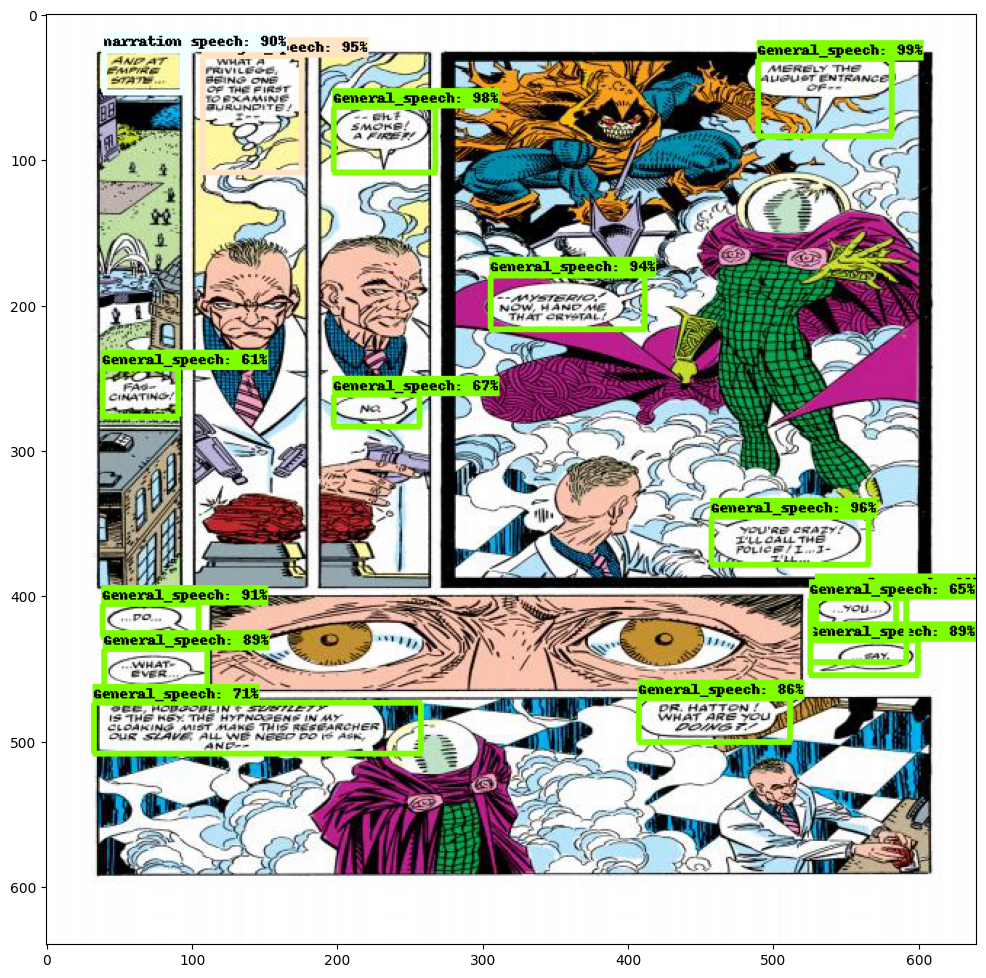

In [ ]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed. 
import random

TEST_IMAGE_PATHS = glob.glob('/content/test/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.5,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score



In [ ]:
detect_fn(input_tensor)

({'detection_boxes': <tf.Tensor: shape=(1, 100, 4), dtype=float32, numpy=
  array([[[5.23362339e-01, 7.29185700e-01, 6.76439822e-01, 9.61632729e-01],
          [6.48520291e-02, 5.90296984e-01, 1.47794053e-01, 7.09638000e-01],
          [9.26453233e-01, 3.72515082e-01, 9.66506124e-01, 4.79657590e-01],
          [7.43627787e-01, 5.18437684e-01, 7.98735380e-01, 6.35539114e-01],
          [6.77162290e-01, 4.54847068e-02, 7.17298746e-01, 2.10429087e-01],
          [6.47472143e-01, 3.88937443e-02, 6.73379421e-01, 1.61626816e-01],
          [6.10587969e-02, 5.94595313e-01, 1.53002709e-01, 7.05741763e-01],
          [6.07021213e-01, 7.47587740e-01, 6.83413982e-01, 9.47472751e-01],
          [6.67310715e-01, 4.14823964e-02, 7.05285668e-01, 1.90849900e-01],
          [6.08760297e-01, 7.51378596e-01, 6.86554134e-01, 8.52641165e-01],
          [7.44448125e-01, 5.20897985e-01, 8.48954976e-01, 6.26032829e-01],
          [5.19563913e-01, 7.21585393e-01, 6.83034301e-01, 9.67614412e-01],
          [8.8

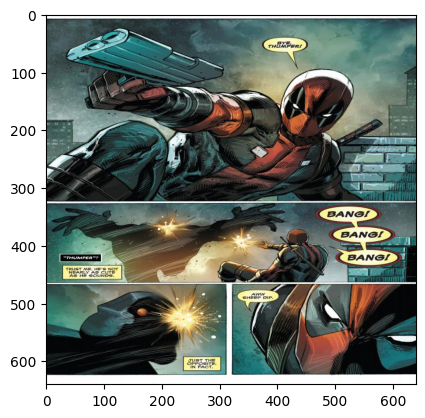

In [ ]:
plt.imshow(image_np)
plt.show()

In [ ]:
#boxes = detections['detection_boxes'].numpy()[0]
#scores = detections['detection_scores'].numpy()[0]

In [ ]:
from collections import namedtuple
from shapely.geometry import Polygon

from google.colab import drive
drive.mount('/content/drive')

#model_dir

MessageError: ignored

In [ ]:
!pip install pytesseract
!apt install tesseract-ocr

#import pkg_resources
import pytesseract
import cv2
#import argparse

from PIL import Image

from skimage.restoration import denoise_wavelet
from google.colab.patches import cv2_imshow
from tensorflow.keras.preprocessing import image

#custom_oem_psm_config = r'--oem 3 --psm 6'

In [ ]:
!apt-get install tesseract-ocr-por

In [ ]:
!tesseract --list-langs


In [ ]:
pytesseract.get_tesseract_version() 

In [ ]:
test_location = dataset.location + "/test/"

In [ ]:
TEST_IMAGE_PATHS = glob.glob('/content/test/test/*.jpg')
image_path = random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(TEST_IMAGE_PATHS[0])

In [ ]:
img = image.load_img(TEST_IMAGE_PATHS[7],target_size=(680,680)) #1080, 880
img = image.img_to_array(img, dtype='uint8')

cv2_imshow(img)

In [ ]:
norm = cv2.normalize(src= img, dst=None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

#gray = cv2.cvtColor(norm, cv2.COLOR_BGR2HSV)

#sharpen_kernel = np.array([[-1,-1,-1], [-1,9,-1], [-1,-1,-1]])
#sharpen = cv2.filter2D(img, -1, sharpen_kernel)

gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

thresh = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]

#msk = cv2.inRange(gray, np.array([0, 0, 123]), np.array([179, 255, 255]))

#invert = cv2.bitwise_not(thresh)

cv2_imshow(thresh)
#Image.fromarray(image_np)

In [ ]:
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
msk = cv2.inRange(hsv, np.array([0, 0, 0]), np.array([179, 255, 80]))
krn = cv2.getStructuringElement(cv2.MORPH_RECT, (5, 3))
dlt = cv2.dilate(msk, krn, iterations=1)
thr = 255 - cv2.bitwise_and(dlt, msk)
txt = pytesseract.image_to_string(thr, config="-c tessedit_char_whitelist=abcdefghijklmnopqrstuvwxyz --psm 6 --oem 3")

print(txt)

In [ ]:
text = pytesseract.image_to_string(thresh, lang='eng')

text

In [ ]:
test = pytesseract.image_to_string(img, lang = "eng", config = '-l eng --psm 6 --oem 3')

#'-l eng --psm 7 --oem 3'
test

In [ ]:
test = pytesseract.image_to_string(thresh, lang = "eng", config = ' --psm 6 --oem 3')

#'-l eng --psm 7 --oem 3'
test

In [ ]:
#test = pytesseract.image_to_string(thresh, config = '-c tessedit_char_whitelist=abcdefghijklmnopqrstuvwxyz --psm 3')

#'-l eng --psm 7 --oem 3'
#test

In [ ]:
!pip install easyocr

import easyocr

In [ ]:
reader = easyocr.Reader(['en'], gpu=True)

In [ ]:
#reader.readtext(thresh, decoder = 'wordbeamsearch', paragraph = True)
#tester = reader.readtext(thresh, decoder = 'beamsearch', allowlist = "abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ\'!?.", paragraph = True, width_ths = .15, height_ths = .15)

In [ ]:
reader.readtext(img, decoder = 'wordbeamsearch', paragraph = True)

In [ ]:
tester = reader.readtext(thresh, decoder = 'beamsearch', allowlist = "abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ\'!?.", paragraph = True, width_ths = .15, height_ths = .15)
tester

In [ ]:
#texts = [detection[1] for detection in result if detection[2] > 0.5]

In [ ]:
!nvidia-smi

In [ ]:
import zipfile
import datetime
import string
import glob
import math
import os

import tqdm
import matplotlib.pyplot as plt
import tensorflow as tf
import sklearn.model_selection

import keras_ocr

assert tf.test.is_gpu_available()

In [ ]:
!pip install -U git+https://github.com/faustomorales/keras-ocr.git#egg=keras-ocr

In [ ]:
try:
  from google.colab import drive
  import os
  drive.mount('/content/drive')
  data_dir = 'drive/My Drive/colab/keras-ocr'
  os.makedirs(data_dir, exist_ok=True)
except ImportError:
  data_dir = '.'

In [ ]:
!pip install keras-ocr

import keras_ocr 
#pipeline = keras_ocr.pipeline.Pipeline(detector=detector, recognizer=recognizer)

In [ ]:
alphabet = string.digits + string.ascii_letters + '!?. '
recognizer_alphabet = ''.join(sorted(set(alphabet.lower())))
fonts = keras_ocr.data_generation.get_fonts(
    alphabet=alphabet,
    cache_dir=data_dir
)
backgrounds = keras_ocr.data_generation.get_backgrounds(cache_dir=data_dir)

In [ ]:
detector = keras_ocr.detection.Detector(weights='clovaai_general')
recognizer = keras_ocr.recognition.Recognizer(
    alphabet=recognizer_alphabet,
    weights='kurapan'
)
recognizer.compile()
for layer in recognizer.backbone.layers:
    layer.trainable = False

In [ ]:
pipeline = keras_ocr.pipeline.Pipeline(detector=detector, recognizer=recognizer)

In [ ]:
test_images = TEST_IMAGE_PATHS[:1]

In [ ]:
thresh = cv2.threshold(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY), 60, 255, cv2.THRESH_BINARY_INV | cv2.THRESH_OTSU)[1]
cv2_imshow(thresh)


In [ ]:
images = [keras_ocr.tools.read(img) for img in test_images]

In [ ]:
prediction_groups = pipeline.recognize(images)

In [ ]:
for predictions in prediction_groups[0]:
  print(predictions[0])